In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# jax
import jax.numpy as jnp
import time

import sys
import os

from utils_training.optimize_pyomo_rl import ExperimentRunner
from datetime import datetime, timedelta
from utils.preprocess import DataPreprocessor
from models.nn_pyomo_admm_1 import NeuralODEPyomoADMM

In [2]:
start_date = '2015-01-10'
def generate_dates(start_date, sequence_len = 5, frequency = 2):
    start_date = datetime.strptime(start_date, '%Y-%m-%d')
    date_sequences = [start_date + timedelta(days=i*frequency) for i in range(sequence_len)]
    date_sequences_str = [date.strftime('%Y-%m-%d') for date in date_sequences]
    return date_sequences_str

---
# Single Model

In [9]:
tol = 1e-6
start_date = '2015-01-15'
extra_input = {}
extra_input['params_data'] = {'file_path': '../00_data/df_train.csv', 'start_date': start_date, 
                'n_points': 600, 'split': 360, 'n_days': 1, 'm': 1, 
                'prev_hour': False, 'prev_week': True, 'prev_year': True,
                'spacing': 'gauss_radau',
                'encoding': {'settlement_date': 't', 'temperature': 'var1', 'hour': 'var2', 'nd': 'y'},}

extra_input['params_sequence'] = {'sequence_len': 10, 'frequency': 5}
extra_input['params_model'] = {'layer_sizes': [7, 32, 1], 'penalty': 1e-7}
extra_input['params_solver'] = { "tol" : tol, 
                         "halt_on_ampl_error" : 'yes', "print_level": 1, "max_iter": 500, 'warm_start_init_point': 'yes'}

extra_input['plot_odeint'] = True

runner = ExperimentRunner(start_date, 'default', extra_input)
runner.run()

Generating default parameters for ode solver
Running iteration 1 with parameters: 1
{'layer_sizes': [7, 32, 1], 'penalty': 1e-07, 'w_init_method': 'xavier'}
Spacing type: gauss_radau
w init method: xavier
seed None
y
Redirect logs: False
Ipopt 3.14.16: tol=1e-06
halt_on_ampl_error=yes
print_level=1
max_iter=500
warm_start_init_point=yes


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

Ipopt 3.14.16: print_level=1


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
     

In [11]:
single_model_results = runner.results_full
df_single = pd.DataFrame(single_model_results).T
df_single.reset_index(inplace=True)
df_single.rename(columns={'level_0': 'regularization'}, inplace=True)
df_single.drop(columns=['level_1', 'result', 'mse_odeint', 'mse_odeint_test'], inplace=True)
df_single

,regularization,times_elapsed,mse_coll_ode,mse_coll_ode_test
0,1,138.895922,0.016222,3.723765
1,1,126.11208,0.245577,0.170369
2,1,129.26724,0.071075,1.548305
3,1,128.322042,0.247227,1.156373
4,1,120.835124,0.10757,0.112877
5,1,120.723368,0.028736,0.215445
6,1,115.671421,0.009243,4.023152
7,1,129.231415,0.046491,0.802084
8,1,111.541112,0.056516,0.200651
9,1,110.367918,0.448217,1.526294


In [10]:
# df_single.to_csv('results_nn_pyomo_single.csv', index=False)

df_single = pd.read_csv('results_nn_pyomo_single.csv')

---
# ADMM

In [3]:
# Constants and Configurations
PENALTY = 1e-5
LAYER_SIZES = [7, 32, 1]
tol = 1e-4
params = {
    "tol": tol,
    "dual_inf_tol": tol,
    "compl_inf_tol": tol,
    "constr_viol_tol": tol,
    "halt_on_ampl_error": 'yes',
    "print_level": 5,
    "max_iter": 500
}
file_path = '../00_data/df_train.csv'
encoding = {'settlement_date': 't', 'temperature': 'var1', 'hour': 'var2', 'nd': 'y'}

date_sequences_str = generate_dates(start_date, sequence_len = 10, frequency = 5)

def prepare_data(start_date, file_path, encoding):
    data_preprocessor = DataPreprocessor(
        file_path, start_date=start_date, number_of_points = 360, n_days = 1, m = 1, 
        prev_hour = False, prev_week = True, prev_year = True,
        feature_encoding=encoding, split=180, spacing = 'gauss_radau', smooth = False)
    data_subsample = data_preprocessor.load_data()
    return data_preprocessor.preprocess_data(data_subsample), str(data_preprocessor.end_date), data_preprocessor.derivative_matrix()

In [4]:
results = {}
for start_date in date_sequences_str:
    (df_train_1, df_test_1), end_date, (D_1, _) = prepare_data(start_date, file_path, encoding)
    (df_train_2, df_test_2), _, (D_2, D_2_test) = prepare_data(end_date, file_path, encoding)

    # dhift time
    shift = df_train_2['t'].max() - df_train_2['t'].min()
    df_train_2['t'] += shift
    df_test_2['t'] += shift

    # concatenate data
    ys = np.concatenate([df_train_1['y'].values[:, None], df_train_2['y'].values[:, None]], axis = 0)
    ts = np.concatenate([df_train_1['t'], df_train_2['t']])
    Xs = np.concatenate([df_train_1.drop(columns=['y', 't']).values, df_train_2.drop(columns=['y', 't']).values], axis=0)
    Ds = [D_1, D_2]

    # Model and solve
    ode_model = NeuralODEPyomoADMM(
        y_observed=ys, t=ts, first_derivative_matrix=Ds,
        extra_input=Xs, y_init=ys, layer_sizes=LAYER_SIZES,
        act_func="tanh", penalty_lambda_reg=PENALTY, rho=5.0,
        time_invariant=True, w_init_method='xavier', params=params,
        test_data = {'t': df_test_2['t'], 'y': df_test_2['y'], 'D': D_2_test, 'X': df_test_2.drop(columns=['y', 't']).values}
    )
    
    result = ode_model.admm_solve(iterations = 20, tol_primal=1e-3, record=True)
    results[start_date] = result

# prepare test data
t_test = df_test_2['t']
y_test = df_test_2['y']
X_test = df_test_2.drop(columns=['y', 't']).values

----------------------------------------------------------------------------------------------------
ADMM Iteration 1/20; 0
----------------------------------------------------------------------------------------------------
Ipopt 3.14.16: tol=0.0001
dual_inf_tol=0.0001
compl_inf_tol=0.0001
constr_viol_tol=0.0001
halt_on_ampl_error=yes
print_level=5
max_iter=500


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.16, running with linear solver MUMPS 5.7.1.

Number of nonzeros in equality constraint Jacobian...:    83951
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.......

In [5]:
df = pd.DataFrame(results).T
df

,primal_residual,mae_collocation,mse_collocation,mae_diffrax,mse_diffrax,iter,time_elapsed,mse_collocation_test
2015-01-10,"[222.42494511789715, 222.42493452808463, 9.824...",[],"[5.308684975190426, 5.308683668207849, 2.43738...",[],"[5.4267761462032515, 5.442370866345143, 2.5033...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[15.60362434387207, 16.097166299819946, 19.156...","[2.7114871189693917, 2.711487314351647, 1.8909..."
2015-01-15,"[234.4522415436159, 234.38622951280576, 6.0007...",[],"[1.2638712430621084, 1.2280515578332023, 0.822...",[],"[1.262819086484458, 1.2555524353975234, 0.8261...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[23.967968225479126, 25.44255757331848, 31.639...","[2.145960765710972, 2.12048069257867, 2.294977..."
2015-01-20,"[216.68200971401595, 216.54769733427725, 6.718...",[],"[11.769758806247033, 12.038588969979832, 3.273...",[],"[12.915453101949899, 12.847795131634586, 45.03...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[21.32999300956726, 22.68383479118347, 25.4818...","[18.382956909669232, 18.62348071385317, 15.537..."
2015-01-25,"[207.2234682057675, 207.22346233001528, 6.0190...",[],"[4.424099623376806, 4.424119182474083, 3.29853...",[],"[4.4168233179319705, 4.399844673660266, 3.2795...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[28.541685819625854, 29.27264380455017, 33.277...","[13.019845189506006, 13.01986490050545, 13.359..."
2015-01-30,"[215.70567977793425, 215.73534109504493, 5.827...",[],"[1.1996140254592211, 1.1934613235671725, 0.506...",[],"[1.2262895828460154, 1.2181529616316582, 0.480...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[32.35979199409485, 33.825655937194824, 39.406...","[2.371956399275451, 2.369467792594062, 2.35623..."
2015-02-04,"[228.5307899690712, 227.47700120973315, 7.6744...",[],"[2.118111807583048, 2.2768401850511206, 0.8206...",[],"[161.4055318186474, 165.76435528289784, 128.10...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[23.72862219810486, 25.413822174072266, 29.262...","[9.34514896135492, 10.878773556896196, 13.9793..."
2015-02-09,"[220.43595665926662, 216.9527660590499, 7.9000...",[],"[2.272889335657167, 4.385658605218447, 1.90598...",[],"[309.95939280119575, 207.22965112449972, 136.3...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[34.90526008605957, 41.34831929206848, 44.6549...","[1.5295739362842862, 1.1991462382393225, 1.772..."
2015-02-14,"[211.1977422910282, 211.1977451534552, 6.72337...",[],"[5.187074224312254, 5.187070792994917, 1.81055...",[],"[5.264546933784369, 5.227612282610101, 1.87777...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[42.88392901420593, 44.446582078933716, 47.495...","[12.949711345491876, 12.949700526622593, 12.94..."
2015-02-19,"[236.92846056242374, 236.92846038820954, 6.872...",[],"[8.994249709434433, 8.994251045607449, 3.92026...",[],"[22.63977140745058, 21.54651002455313, 11.3764...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[60.80572271347046, 62.298712968826294, 69.295...","[2.0226461191425, 2.0226457370997846, 2.645480..."
2015-02-24,"[230.7725736709332, 232.64194918739864, 11.324...",[],"[6.191426764350521, 7.716929211754574, 1.80721...",[],"[77.04928573958803, 41.37022710854937, 8.80336...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...","[55.9253306388855, 60.13162565231323, 68.43601...","[10.768786102666787, 11.411767499681213, 14.31..."


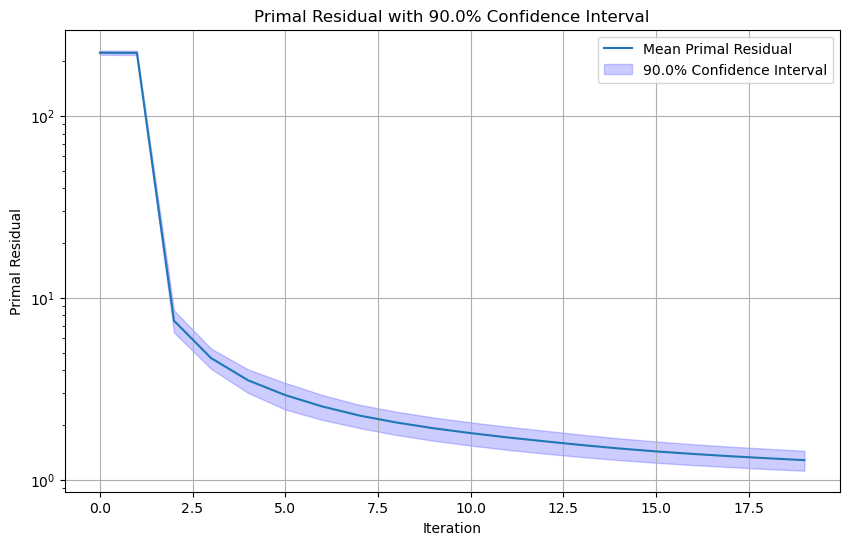

In [6]:
from scipy.stats import t

# Collect all data into a list of dictionaries
data_list = []
for i in range(df.shape[0]):
    mse = df['primal_residual'].iloc[i]
    iters = df['iter'].iloc[i]
    run_label = f'start date = {df.index[i]}'
    data_list.extend([{'iter': it, 'primal_residual': mse_val, 'run': run_label} for it, mse_val in zip(iters, mse)])
    
# Create a new DataFrame from the list
data_df = pd.DataFrame(data_list)

# Group by 'iter' to compute mean and standard deviation
grouped = data_df.groupby('iter')
mean_mse = grouped['primal_residual'].mean()
std_mse = grouped['primal_residual'].std()
n = grouped['primal_residual'].count()

# Compute standard error and confidence intervals
confidence = 0.9
dfree = n - 1
alpha = 1 - confidence
t_crit = t.ppf(1 - alpha/2, dfree)
se_mse = std_mse / np.sqrt(n)
margin_of_error = t_crit * se_mse
upper_bound = mean_mse + margin_of_error
lower_bound = mean_mse - margin_of_error


# Plot the mean with confidence intervals
plt.figure(figsize=(10, 6))
plt.plot(mean_mse.index, mean_mse.values, label='Mean Primal Residual')
plt.fill_between(mean_mse.index, lower_bound, upper_bound, color='blue', alpha=0.2, label=f'{confidence*100}% Confidence Interval')

plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Primal Residual')
plt.title(f'Primal Residual with {confidence*100}% Confidence Interval')
plt.legend()
plt.grid()
plt.show()


In [11]:
# single_model_results = runner.results_full
# df_single = pd.DataFrame(single_model_results).T
# df_single.reset_index(inplace=True)
# df_single.rename(columns={'level_0': 'regularization'}, inplace=True)
# df_single.drop(columns=['level_1', 'result', 'mse_odeint', 'mse_odeint_test'], inplace=True)
# df_single

In [17]:
data_df

,iter,mse_collocation,run
0,0,5.308685,start date = 2015-01-10
1,1,5.308684,start date = 2015-01-10
2,2,2.437390,start date = 2015-01-10
3,3,2.262034,start date = 2015-01-10
4,4,1.920436,start date = 2015-01-10
...,...,...,...
195,15,0.617068,start date = 2015-02-24
196,16,0.598565,start date = 2015-02-24
197,17,0.638212,start date = 2015-02-24
198,18,0.702101,start date = 2015-02-24


In [12]:
from scipy.stats import t

# Collect all data into a list of dictionaries
data_list = []
for i in range(df.shape[0]):
    mse = df['mse_collocation'].iloc[i]
    iters = df['iter'].iloc[i]
    run_label = f'start date = {df.index[i]}'
    data_list.extend([{'iter': it, 'mse_collocation': mse_val, 'run': run_label} for it, mse_val in zip(iters, mse)])
    
# Create a new DataFrame from the list
data_df = pd.DataFrame(data_list)

# Group by 'iter' to compute mean and standard deviation
grouped = data_df.groupby('iter')
mean_mse = grouped['mse_collocation'].mean()
std_mse = grouped['mse_collocation'].std()
n = grouped['mse_collocation'].count()

# Compute standard error and confidence intervals
confidence = 0.7
dfree = n - 1
alpha = 1 - confidence
t_crit = t.ppf(1 - alpha/2, dfree)
se_mse = std_mse / np.sqrt(n)
margin_of_error = t_crit * se_mse
upper_bound = mean_mse + margin_of_error
lower_bound = mean_mse - margin_of_error

first_iter_finishes = np.mean(df.time_elapsed.map(lambda x: x[0]))
time_per_iter = np.mean(df.time_elapsed.map(lambda x: x[-1]) - first_iter_finishes)/len(mean_mse.index - 1)
times = mean_mse.index* time_per_iter + first_iter_finishes

In [13]:
df_single

,regularization,times_elapsed,mse_coll_ode,mse_coll_ode_test
0,1,138.895922,0.016222,3.723765
1,1,126.112080,0.245577,0.170369
2,1,129.267240,0.071075,1.548305
3,1,128.322042,0.247227,1.156373
4,1,120.835124,0.107570,0.112877
5,1,120.723368,0.028736,0.215445
6,1,115.671421,0.009243,4.023152
7,1,129.231415,0.046491,0.802084
8,1,111.541112,0.056516,0.200651
9,1,110.367918,0.448217,1.526294


In [14]:
# df_single = df_single[df_single['regularization'] == 1.000000e-07]

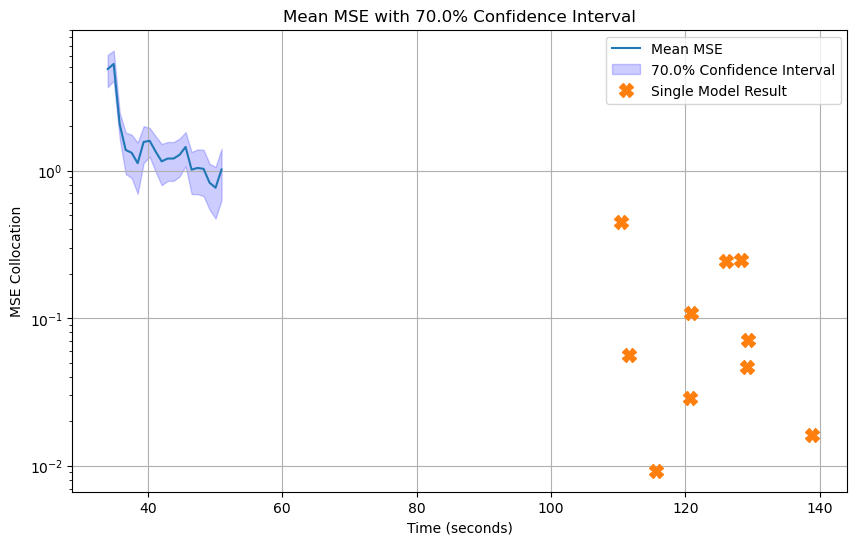

In [15]:
# Plot the mean with confidence intervals
plt.figure(figsize=(10, 6))
plt.plot(times, mean_mse.values, label='Mean MSE')
plt.fill_between(times, lower_bound, upper_bound, color='blue', alpha=0.2, label=f'{confidence*100}% Confidence Interval')

#for i in range(df_single.shape[0]):
plt.plot( df_single.times_elapsed.tolist(), df_single.mse_coll_ode.tolist(), 'X', markersize=10, label=f'Single Model Result')
plt.yscale('log')
plt.xlabel('Time (seconds)')
plt.ylabel('MSE Collocation')
plt.title(f'Mean MSE with {confidence*100}% Confidence Interval')
plt.legend()
plt.grid()
plt.show()

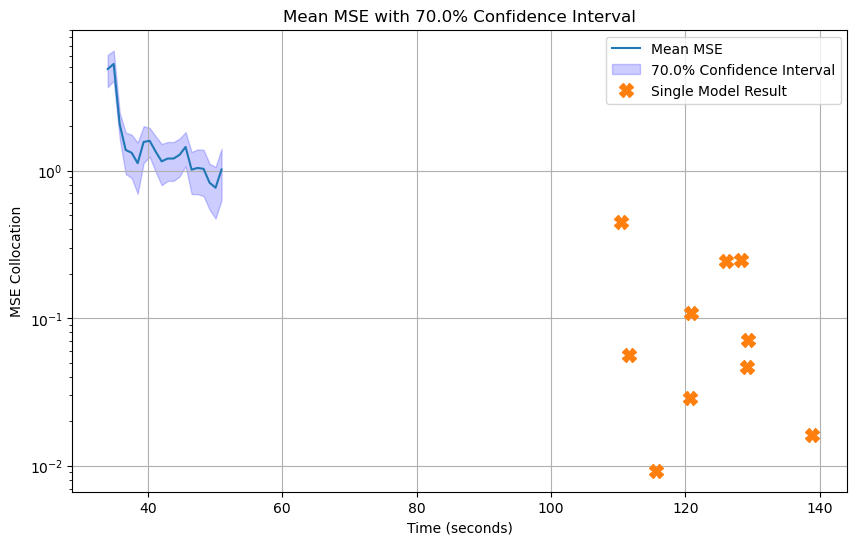

In [16]:
# Plot the mean with confidence intervals
plt.figure(figsize=(10, 6))
plt.plot(times, mean_mse.values, label='Mean MSE')
plt.fill_between(times, lower_bound, upper_bound, color='blue', alpha=0.2, label=f'{confidence*100}% Confidence Interval')

#for i in range(df_single.shape[0]):
plt.plot( df_single.times_elapsed.tolist(), df_single.mse_coll_ode.tolist(), 'X', markersize=10, label=f'Single Model Result')
plt.yscale('log')
plt.xlabel('Time (seconds)')
plt.ylabel('MSE Collocation')
plt.title(f'Mean MSE with {confidence*100}% Confidence Interval')
plt.legend()
plt.grid()
plt.show()

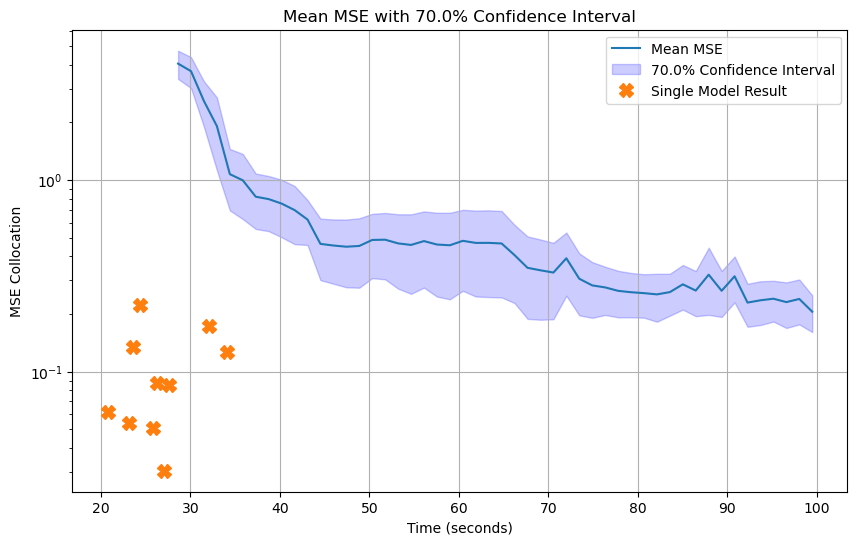

In [41]:
# Plot the mean with confidence intervals
plt.figure(figsize=(10, 6))
plt.plot(times, mean_mse.values, label='Mean MSE')
plt.fill_between(times, lower_bound, upper_bound, color='blue', alpha=0.2, label=f'{confidence*100}% Confidence Interval')

#for i in range(df_single.shape[0]):
plt.plot( df_single.times_elapsed.tolist(), df_single.mse_coll_ode.tolist(), 'X', markersize=10, label=f'Single Model Result')
plt.yscale('log')
plt.xlabel('Time (seconds)')
plt.ylabel('MSE Collocation')
plt.title(f'Mean MSE with {confidence*100}% Confidence Interval')
plt.legend()
plt.grid()
plt.show()

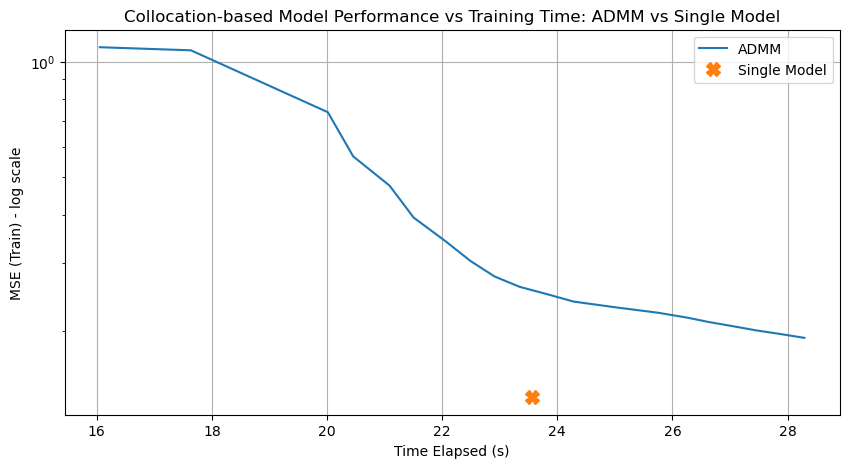

In [28]:
i = 0
plt.figure(figsize=(10, 5))
plt.plot( df.time_elapsed.tolist()[i], df.mse_collocation.tolist()[i], label='ADMM')
#plt.scatter( df.time_elapsed.tolist()[0], df.mse_collocation.tolist()[0])
plt.plot( df_single.times_elapsed.tolist()[i], df_single.mse_coll_ode.tolist()[i], 'X', markersize=10, label='Single Model')
plt.xlabel('Time Elapsed (s)')
plt.ylabel('MSE (Train) - log scale')
plt.yscale('log')
plt.title('Collocation-based Model Performance vs Training Time: ADMM vs Single Model')
plt.legend()
plt.grid()
plt.show()

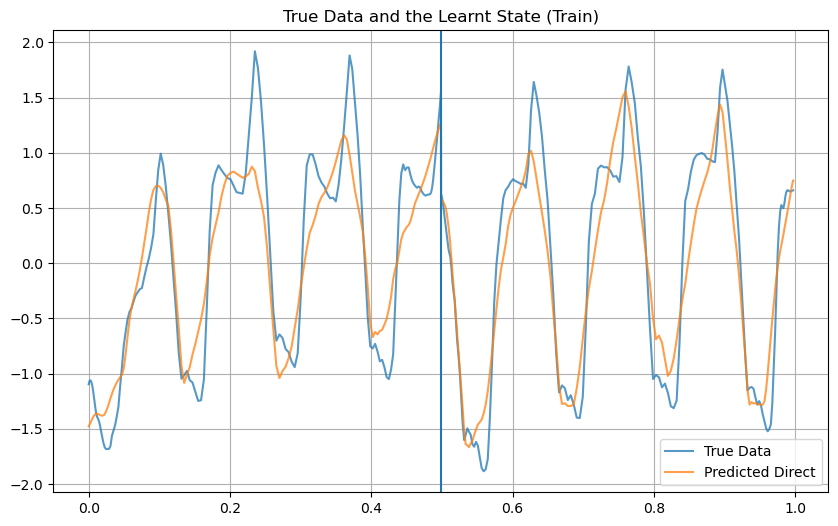

In [29]:
u_model = ode_model.extract_solution().T
plt.figure(figsize=(10, 6))
plt.plot(ts, ys, label='True Data', alpha = 0.75)
plt.plot(ts, u_model, label='Predicted Direct', alpha = 0.75)
plt.axvline(x = np.max(df_train_1['t']))
plt.legend(loc ="lower right")
plt.grid(True)
plt.title("True Data and the Learnt State (Train)")
plt.show()